# Hudson Valley Gentrification and Changes in Farming

## Notebook 4: Spatial Analysis

In [166]:
import pandas as pd
import geopandas as gpd
import os
import numpy as np
import json
import math

# Plotting/mapping
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as cx
from matplotlib import colors

# Feature engineering
from tobler.util import h3fy
from tobler.area_weighted import area_interpolate
import libpysal

# Regression
import statsmodels.formula.api as smf
import spreg
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW

# Spatial autocorrelation
from pysal.lib import weights
from pysal.explore import esda
from splot.esda import plot_moran
from splot.esda import plot_local_autocorrelation

In [167]:
api_key_stadia = os.getenv("STADIA_API_KEY")
api_key_census = os.getenv("CENSUS_API_KEY")
api_key_nass = os.getenv("QUICK_STATS_API_KEY")

In [168]:
proj_nys_east = 26918
proj_hudson_ft = 32118
proj_nyc_ft = 2263
proj_ea = 6933
proj_latlon = 4326

## Define functions

In [169]:
def meters_to_miles(meters):
    return meters/1609
def miles_to_meters(miles):
    return miles*1609
def sqmeters_to_sqmiles(meters):
    return meters/2.59e+6
def sqmiles_to_sqmeters(miles):
    return miles*2.59e+6
def acres_to_sqmeters(acres):
    meters = acres * 4046.8564224
    return meters
def acres_to_sqmiles(acres):
    return acres/640

def zfill3(x):
    zstr = str(x).zfill(3)
    return zstr

In [170]:
def make_hex_grid(gdf, resolution, crs=6933):
    gdf = gdf.copy().to_crs(crs)
    hex_grid = h3fy(gdf, resolution=resolution)
    return hex_grid

def make_hex_grid_pts(gdf, resolution, crs=6933):
    from tobler.util import h3fy
    import geopandas as gpd
    gdf = gdf.copy()
    gdf = gdf.to_crs(crs)
    bounding_box = gdf.dissolve().envelope[0]
    bounding_box = gpd.GeoDataFrame(geometry=[bounding_box])
    bounding_box.crs = gdf.crs
    hex_grid = h3fy(bounding_box, resolution=resolution)
    return hex_grid

In [171]:
def pair_map(gdf1, gdf2, column, crs, title, title1="2017", title2="2022"):
    vmin = min([gdf1[column].min(),gdf2[column].min()])
    vmax = max([gdf1[column].max(),gdf2[column].max()])
    missing_kwds={
            "color": "lightgrey",
            "edgecolor": "black",
            "hatch": "////",
            "label": "Missing values",
        }

    fig, axs = plt.subplots(1,2, constrained_layout=True, figsize=(10,6))
    gdf1.to_crs(crs).plot(column=column, ax=axs[0], vmin=vmin, vmax=vmax, cmap='viridis', missing_kwds=missing_kwds).set_axis_off()
    gdf2.to_crs(crs).plot(column=column, ax=axs[1], vmin=vmin, vmax=vmax, cmap='viridis', missing_kwds=missing_kwds).set_axis_off()

    axs[0].set_title(title1)
    axs[1].set_title(title2)

    for ax in axs:
        cx.add_basemap(ax=ax, crs=gdf1.to_crs(crs).crs, source=cx.providers.CartoDB.Positron)

    cbar = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='viridis')

    fig.colorbar(cbar, ax=axs)
    fig.suptitle(title);

## Load Data

In [320]:
acs2017_df = pd.read_csv("data/acs2017_bg_final.csv", dtype={"GEOIDbg": str})
acs2022_df = pd.read_csv("data/acs2022_bg_final.csv", dtype={"GEOIDbg": str})
acs_diff_2022_2017 = pd.read_csv("data/acs_bg_diff_2022_2017.csv", dtype={"GEOIDbg": str})
acs_diff_2022_2017_pct = pd.read_csv("data/acs_bg_diff_2022_2017_pct.csv", dtype={"GEOIDbg": str})

ag_zipcode_2017_wide = pd.read_csv("data/agcensus_zipcode_2017_wide.csv", dtype={"zipcode": str})
ag_zipcode_2022_wide = pd.read_csv("data/agcensus_zipcode_2022_wide.csv", dtype={"zipcode": str})
ag_county_2017_wide = pd.read_csv("data/agcensus_county_2017_wide.csv", dtype={"county_code": str})
ag_county_2022_wide = pd.read_csv("data/agcensus_county_2022_wide.csv", dtype={"county_code": str})
ag_zipcode_diff_2017_2022 = pd.read_csv("data/agcensus_zipcode_diff_2017_2022.csv", dtype={"zipcode": str})
ag_county_diff_2017_2022 = pd.read_csv("data/agcensus_county_diff_2017_2022.csv", dtype={"county_code": str})

# Agriculture Census variable lookup tables
ag_zipcode_vars = pd.read_csv("data/agcensus_zipcode_vars.csv", dtype={"zipcode": str})
ag_county_vars = pd.read_csv("data/agcensus_county_vars.csv", dtype={"county_code": str})

In [321]:
# import shapefiles
gdf_farms_clean = gpd.read_file(r"data\farms_clean.geojson").to_crs(proj_nys_east)
gdf_farms_core = gpd.read_file(r"data\farms_core.geojson").to_crs(proj_hudson_ft)

gdf_nys_counties = gpd.read_file("data/nys_counties.geojson").to_crs(proj_nys_east)
gdf_zctas_core = gpd.read_file(r"data\zctas_core.geojson").to_crs(proj_hudson_ft)
gdf_tracts2017_core = gpd.read_file("data/tracts_core_2017.geojson").to_crs(proj_hudson_ft)
gdf_tracts2022_core = gpd.read_file("data/tracts_core_2022.geojson").to_crs(proj_hudson_ft)
gdf_bgs2022_core = gpd.read_file("data/bgs_core_2022.geojson").to_crs(proj_hudson_ft)
gdf_counties_core = gpd.read_file("data/counties_core.geojson").to_crs(proj_hudson_ft)

In [322]:
zipcodes = gdf_zctas_core.ZCTA5CE20.values
county_codes = list(gdf_nys_counties.FIPS_CODE.str[-3:])

In [323]:
gdf_nys_counties['county_code'] = gdf_nys_counties.FIPS_CODE.str[2:]

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\pyproj\crs\crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


<Axes: >

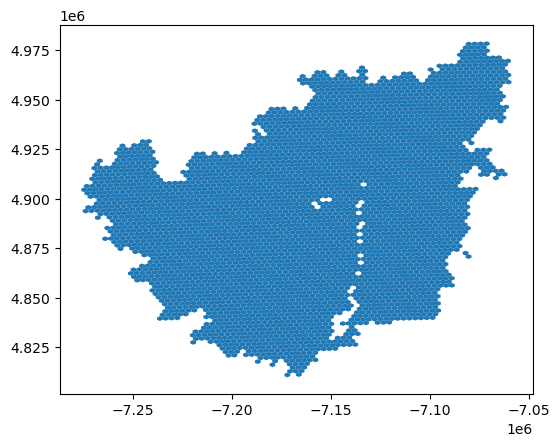

In [324]:
zipcode_hex = make_hex_grid(gdf_zctas_core, resolution=7)
zipcode_hex.plot()

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\pyproj\crs\crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


<Axes: >

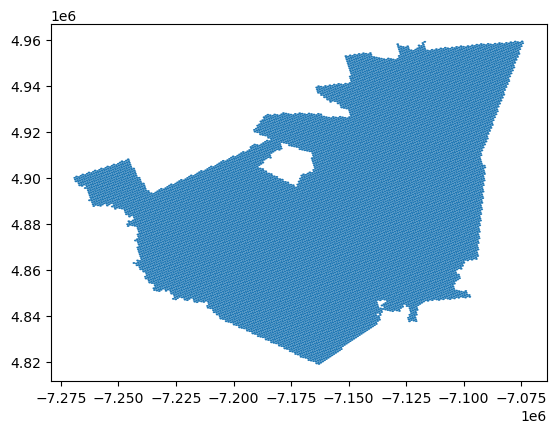

In [325]:
bgs_hex = make_hex_grid(gdf_bgs2022_core, resolution=8)
bgs_hex.plot()

<Axes: >

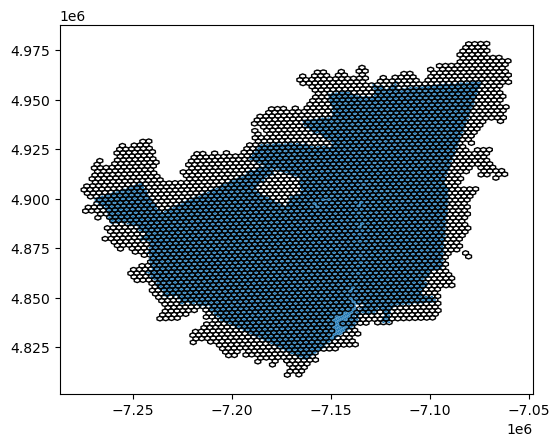

In [326]:
ax = bgs_hex.plot()
zipcode_hex.plot(ax=ax, facecolor="none", edgecolor="black")

## Spatial aggregation/normalization

In [354]:
gdf_acs_2017 = gdf_bgs2022_core[['geometry'] + [col for col in gdf_bgs2022_core.columns[:19]]].merge(acs2017_df[[col for col in acs2017_df.columns[6:]]], how="left", on="GEOIDbg")

In [355]:
gdf_acs_2022 = gdf_bgs2022_core[['geometry'] + [col for col in gdf_bgs2022_core.columns[:19]]].merge(acs2022_df[[col for col in acs2022_df.columns[6:]]], how="left", on="GEOIDbg")

In [357]:
gdf_acs_2017.columns

Index(['geometry', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE', 'GEOID_x',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT',
       'INTPTLON', 'STATE', 'COUNTY', 'TRACT', 'BLOCK_GROUP', 'NAME',
       'GEOID_y', 'GEOIDbg', 'total_pop', 'total_occupied',
       'total_occupied_renter', 'total_occupied_owner', 'total_vacant',
       'seasonal_vacancy', 'total_dwellings', 'income_median',
       'moveinyear_all_trimean', 'moveinyear_owner_trimean',
       'moveinyear_renter_trimean', 'moveinyear_pct_new_all',
       'moveinyear_pct_new_owner', 'moveinyear_pct_new_total_owner',
       'moveinyear_pct_new_renter', 'moveinyear_pct_new_total_renter',
       'rent_lower_quartile', 'rent_median', 'rent_upper_quartile',
       'rent_trimean', 'rentpctincome_median', 'seasonal_vacancy_pct'],
      dtype='object')

In [358]:
for df in [gdf_acs_2017,gdf_acs_2022]:
    df['pop_area'] = df['total_pop']/df['ALAND']

In [359]:
gdf_acs_2017.dropna(how="all", subset=gdf_acs_2017.columns[19:], inplace=True)
gdf_acs_2022.dropna(how="all", subset=gdf_acs_2022.columns[19:], inplace=True)

In [360]:
gdf_acs_2017.isna().sum().reset_index(name="null_vals").query("null_vals > 0")

,index,null_vals
27,income_median,5
28,moveinyear_all_trimean,4
29,moveinyear_owner_trimean,9
30,moveinyear_renter_trimean,29
31,moveinyear_pct_new_all,4
32,moveinyear_pct_new_owner,9
33,moveinyear_pct_new_total_owner,9
34,moveinyear_pct_new_renter,29
35,moveinyear_pct_new_total_renter,29
36,rent_lower_quartile,37


In [361]:
gdf_acs_2022.isna().sum().reset_index(name="null_vals").query("null_vals > 0")

,index,null_vals
27,income_median,5
28,moveinyear_all_trimean,5
29,moveinyear_owner_trimean,21
30,moveinyear_renter_trimean,67
31,moveinyear_pct_new_all,5
32,moveinyear_pct_new_owner,21
33,moveinyear_pct_new_total_owner,21
34,moveinyear_pct_new_renter,67
35,moveinyear_pct_new_total_renter,67
36,rent_lower_quartile,80


### Agriculture Census: ZIP code level

In [178]:
ag_zipcode_2017_wide.columns

Index(['zipcode', 'number_full_owner_operators', 'number_high_sales_farms',
       'number_large_farms', 'number_low_sales_farms', 'number_medium_farms',
       'number_medium_sales_farms', 'number_part_owner_operators',
       'number_small_farms', 'number_tenant_operators',
       'total_farms_harvesting', 'total_farms_selling',
       'total_full_time_farmers', 'pct_small_farms', 'pct_medium_farms',
       'pct_large_farms', 'pct_low_sales_farms', 'pct_medium_sales_farms',
       'pct_high_sales_farms', 'total_operators', 'pct_full_owner_operators',
       'pct_part_owner_operators', 'pct_tenant_operators',
       'pct_full_time_farmers'],
      dtype='object')

In [179]:
[col for col in ag_zipcode_2017_wide.columns if col.startswith("pct_")]

['pct_small_farms',
 'pct_medium_farms',
 'pct_large_farms',
 'pct_low_sales_farms',
 'pct_medium_sales_farms',
 'pct_high_sales_farms',
 'pct_full_owner_operators',
 'pct_part_owner_operators',
 'pct_tenant_operators',
 'pct_full_time_farmers']

In [180]:
gdf_ag_zipcode_2017 = gdf_zctas_core.merge(ag_zipcode_2017_wide, how="left", left_on="ZCTA5CE20", right_on="zipcode").to_crs(proj_ea)
gdf_ag_zipcode_2022 = gdf_zctas_core.merge(ag_zipcode_2022_wide, how="left", left_on="ZCTA5CE20", right_on="zipcode").to_crs(proj_ea)

In [181]:
gdf_ag_zipcode_2017.columns

Index(['ZCTA5CE20', 'GEOID20', 'CLASSFP20', 'MTFCC20', 'FUNCSTAT20', 'ALAND20',
       'AWATER20', 'INTPTLAT20', 'INTPTLON20', 'geometry', 'zipcode',
       'number_full_owner_operators', 'number_high_sales_farms',
       'number_large_farms', 'number_low_sales_farms', 'number_medium_farms',
       'number_medium_sales_farms', 'number_part_owner_operators',
       'number_small_farms', 'number_tenant_operators',
       'total_farms_harvesting', 'total_farms_selling',
       'total_full_time_farmers', 'pct_small_farms', 'pct_medium_farms',
       'pct_large_farms', 'pct_low_sales_farms', 'pct_medium_sales_farms',
       'pct_high_sales_farms', 'total_operators', 'pct_full_owner_operators',
       'pct_part_owner_operators', 'pct_tenant_operators',
       'pct_full_time_farmers'],
      dtype='object')

In [182]:
for gdf in [gdf_ag_zipcode_2017,gdf_ag_zipcode_2022]:
    gdf['farms_harvesting_per_sqmi'] = gdf['total_farms_harvesting']/gdf['ALAND20'].apply(sqmeters_to_sqmiles)
    gdf['farms_selling_per_sqmi'] = gdf['total_farms_selling']/gdf['ALAND20'].apply(sqmeters_to_sqmiles)
    gdf['full_time_farmers_per_sqmi'] = gdf['total_full_time_farmers']/gdf['ALAND20'].apply(sqmeters_to_sqmiles)
    gdf['operators_per_sqmi'] = (gdf['number_full_owner_operators'] + gdf['number_part_owner_operators'] + gdf['number_tenant_operators'])/gdf['ALAND20'].apply(sqmeters_to_sqmiles)
    gdf['small_farms_per_sqmi'] = gdf['number_small_farms']/gdf['ALAND20'].apply(sqmeters_to_sqmiles)
    gdf['medium_farms_per_sqmi'] = gdf['number_medium_farms']/gdf['ALAND20'].apply(sqmeters_to_sqmiles)
    gdf['large_farms_per_sqmi'] = gdf['number_large_farms']/gdf['ALAND20'].apply(sqmeters_to_sqmiles)
    gdf['small_farm_index'] = gdf['pct_small_farms']*gdf['small_farms_per_sqmi']
    gdf['medium_farm_index'] = gdf['pct_medium_farms']*gdf['medium_farms_per_sqmi']
    gdf['large_farm_index'] = gdf['pct_large_farms']*gdf['large_farms_per_sqmi']
gdf_ag_zipcode_2017.columns

Index(['ZCTA5CE20', 'GEOID20', 'CLASSFP20', 'MTFCC20', 'FUNCSTAT20', 'ALAND20',
       'AWATER20', 'INTPTLAT20', 'INTPTLON20', 'geometry', 'zipcode',
       'number_full_owner_operators', 'number_high_sales_farms',
       'number_large_farms', 'number_low_sales_farms', 'number_medium_farms',
       'number_medium_sales_farms', 'number_part_owner_operators',
       'number_small_farms', 'number_tenant_operators',
       'total_farms_harvesting', 'total_farms_selling',
       'total_full_time_farmers', 'pct_small_farms', 'pct_medium_farms',
       'pct_large_farms', 'pct_low_sales_farms', 'pct_medium_sales_farms',
       'pct_high_sales_farms', 'total_operators', 'pct_full_owner_operators',
       'pct_part_owner_operators', 'pct_tenant_operators',
       'pct_full_time_farmers', 'farms_harvesting_per_sqmi',
       'farms_selling_per_sqmi', 'full_time_farmers_per_sqmi',
       'operators_per_sqmi', 'small_farms_per_sqmi', 'medium_farms_per_sqmi',
       'large_farms_per_sqmi', 'small_far

In [183]:
len(gdf_ag_zipcode_2017)
gdf_ag_zipcode_2017.columns

Index(['ZCTA5CE20', 'GEOID20', 'CLASSFP20', 'MTFCC20', 'FUNCSTAT20', 'ALAND20',
       'AWATER20', 'INTPTLAT20', 'INTPTLON20', 'geometry', 'zipcode',
       'number_full_owner_operators', 'number_high_sales_farms',
       'number_large_farms', 'number_low_sales_farms', 'number_medium_farms',
       'number_medium_sales_farms', 'number_part_owner_operators',
       'number_small_farms', 'number_tenant_operators',
       'total_farms_harvesting', 'total_farms_selling',
       'total_full_time_farmers', 'pct_small_farms', 'pct_medium_farms',
       'pct_large_farms', 'pct_low_sales_farms', 'pct_medium_sales_farms',
       'pct_high_sales_farms', 'total_operators', 'pct_full_owner_operators',
       'pct_part_owner_operators', 'pct_tenant_operators',
       'pct_full_time_farmers', 'farms_harvesting_per_sqmi',
       'farms_selling_per_sqmi', 'full_time_farmers_per_sqmi',
       'operators_per_sqmi', 'small_farms_per_sqmi', 'medium_farms_per_sqmi',
       'large_farms_per_sqmi', 'small_far

In [ ]:
gdf_ag_zipcode_2017.dropna(how="all", subset=gdf_ag_zipcode_2017.columns[11:], inplace=True)
gdf_ag_zipcode_2022.dropna(how="all", subset=gdf_ag_zipcode_2022.columns[11:], inplace=True)

#### Look at some maps

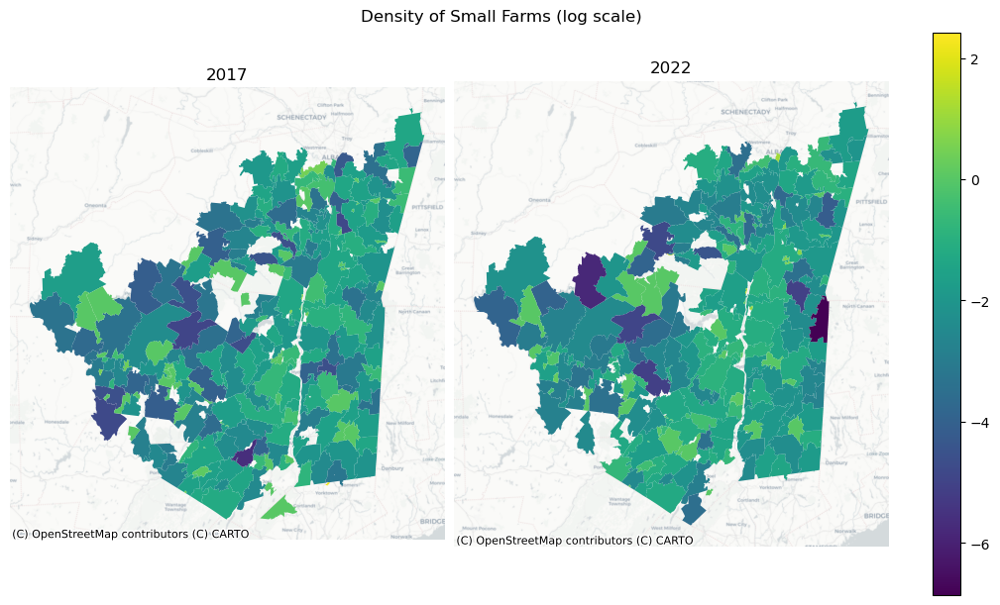

In [185]:
pair_map(gdf_ag_zipcode_2017.assign(small_farm_index = lambda df: df.small_farm_index.apply(lambda x: math.log(x) if x > 0 else x)),
         gdf_ag_zipcode_2022.assign(small_farm_index = lambda df: df.small_farm_index.apply(lambda x: math.log(x) if x > 0 else x)),
         column="small_farm_index", crs=proj_hudson_ft, title="Density of Small Farms (log scale)")

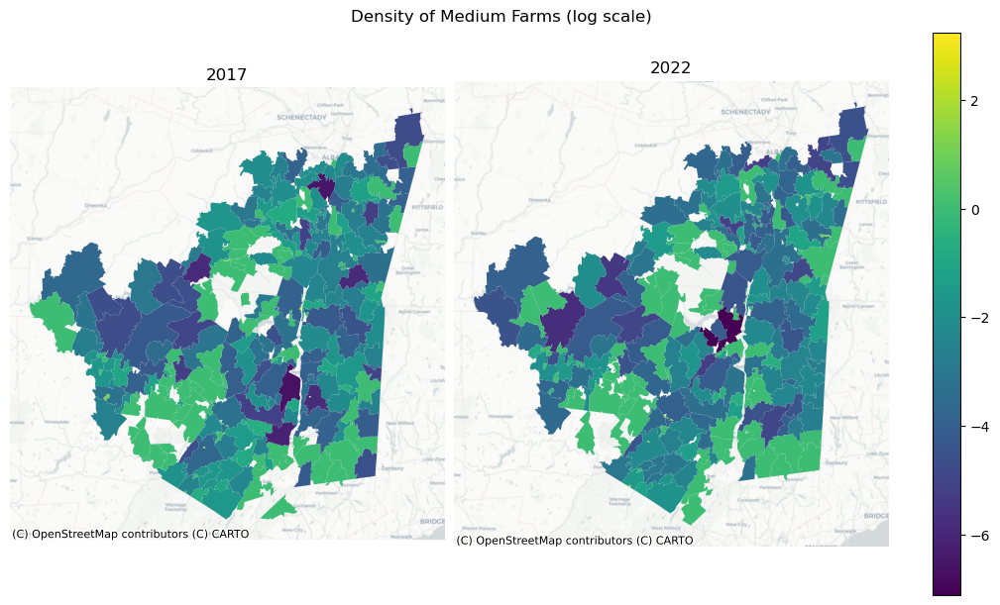

In [186]:
pair_map(gdf_ag_zipcode_2017.assign(medium_farm_index = lambda df: df.medium_farm_index.apply(lambda x: math.log(x) if x > 0 else x)),
         gdf_ag_zipcode_2022.assign(medium_farm_index = lambda df: df.medium_farm_index.apply(lambda x: math.log(x) if x > 0 else x)),
         column="medium_farm_index", crs=proj_hudson_ft, title="Density of Medium Farms (log scale)")

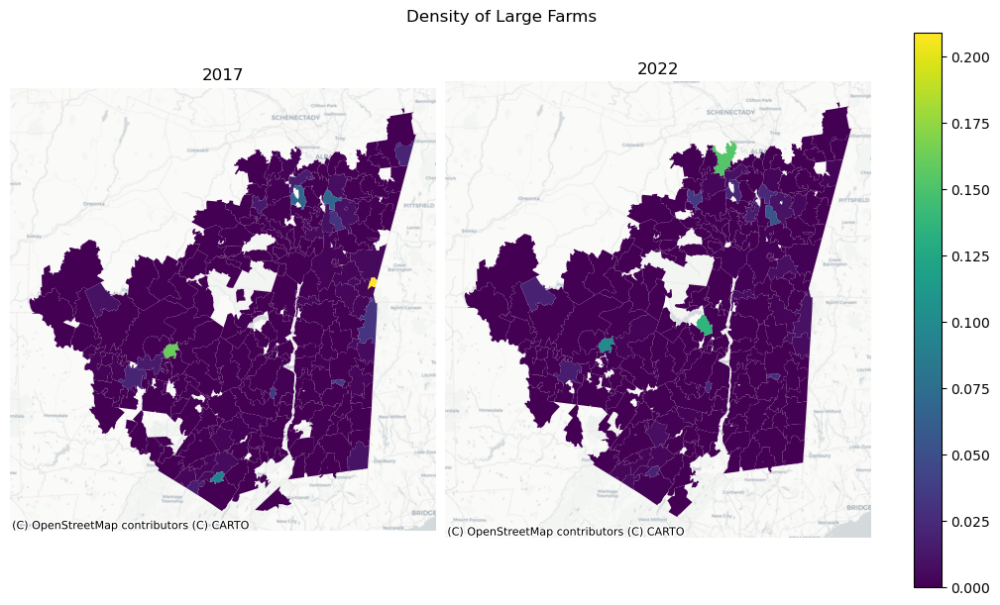

In [187]:
pair_map(gdf_ag_zipcode_2017,gdf_ag_zipcode_2022,"large_farm_index", crs=proj_hudson_ft, title="Density of Large Farms")

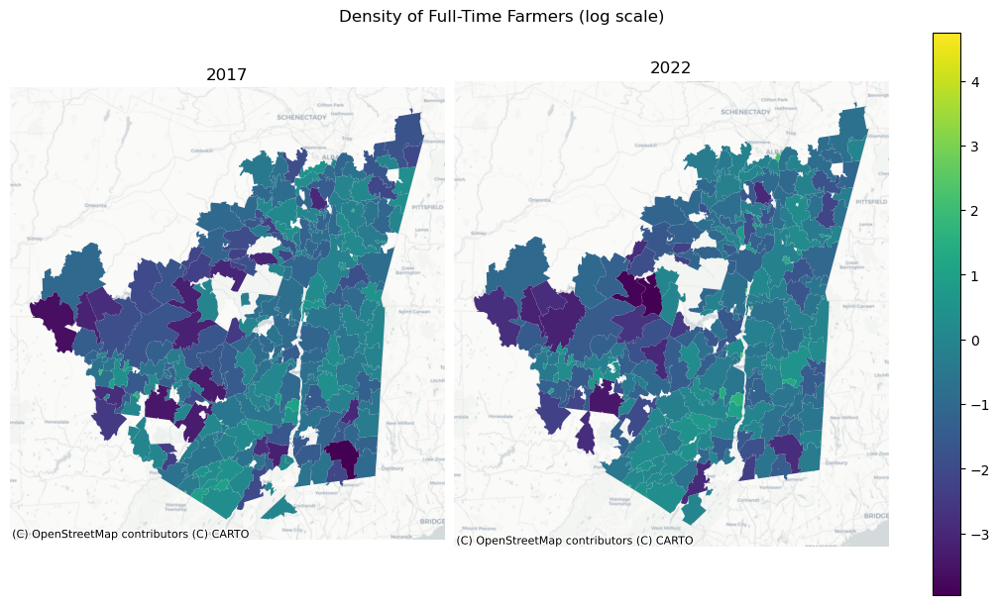

In [188]:
pair_map(gdf_ag_zipcode_2017.assign(full_time_farmers_per_sqmi = lambda df: df.full_time_farmers_per_sqmi.apply(lambda x: math.log(x) if x > 0 else x)),
         gdf_ag_zipcode_2022.assign(full_time_farmers_per_sqmi = lambda df: df.full_time_farmers_per_sqmi.apply(lambda x: math.log(x) if x > 0 else x)),
         column="full_time_farmers_per_sqmi", crs=proj_hudson_ft, title="Density of Full-Time Farmers (log scale)")

<Axes: >

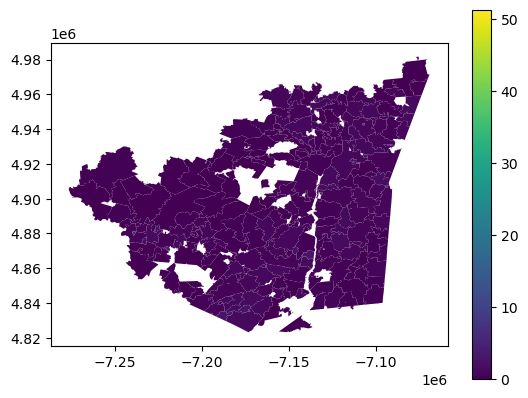

In [189]:
gdf_ag_zipcode_2017.plot(column="full_time_farmers_per_sqmi", legend=True)

<Axes: >

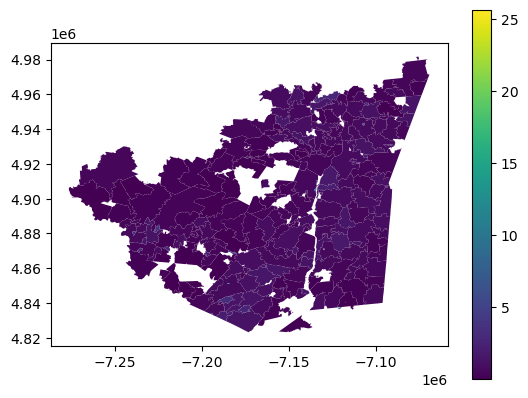

In [190]:
gdf_ag_zipcode_2017.plot(column="operators_per_sqmi", legend=True)

<Axes: >

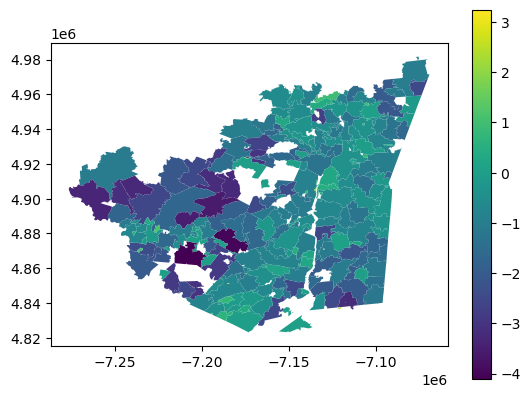

In [191]:
gdf_ag_zipcode_2017.assign(farms_harvesting_per_sqmi = lambda df: df.farms_harvesting_per_sqmi.apply(lambda x: math.log(x) if x > 0 else x)).plot(column="farms_harvesting_per_sqmi", legend=True)

### Agriculture Census: county level

In [236]:
ag_county_2017_wide.columns

Index(['county_code', 'acres_harvested_full_owners',
       'acres_harvested_part_owners', 'acres_harvested_tenants',
       'acres_operated_full_owners', 'acres_operated_part_owners',
       'acres_operated_tenants', 'acres_owned_part_owners',
       'acres_rented_part_owners', 'hired_labor_cat_1', 'hired_labor_cat_2',
       'hired_labor_cat_3', 'housed_off_farm', 'housed_on_farm',
       'net_income_operations', 'net_income_producers', 'producers_agecat_1',
       'producers_agecat_2', 'producers_agecat_3', 'producers_agecat_4',
       'producers_agecat_5', 'producers_agecat_6', 'producers_agecat_7',
       'producers_avg_age', 'producers_avg_career', 'producers_early_career',
       'producers_late_career', 'producers_mid_career',
       'rent_burdened_operations', 'rent_costs_dollars',
       'total_acres_cropland', 'total_acres_farmland',
       'total_contract_labor_expenses', 'total_farm_value',
       'total_farm_value_per_acre', 'total_farms', 'total_full_time_farmers',
     

In [243]:
gdf_ag_county_2017 = gdf_nys_counties.merge(ag_county_2017_wide, how="left", on="county_code").to_crs(proj_ea)
gdf_ag_county_2022 = gdf_nys_counties.merge(ag_county_2022_wide, how="left", on="county_code").to_crs(proj_ea)

In [244]:
gdf_ag_county_2017.head()

,OBJECTID,NAME,ABBREV,GNIS_ID,FIPS_CODE,SWIS,NYSP_ZONE,POP1990,POP2000,POP2010,...,avg_farm_value,avg_income_per_farm,avg_net_income_per_farm,avg_net_income_per_producer,pct_farmers_early_career,pct_farmers_mid_career,pct_farmers_late_career,pct_full_time_farmers,pct_producers_housed_on_farm,pct_producers_housed_off_farm
0,1,Albany,ALBA,974099,36001,010000,East,292594,294565,304204,...,601881.818182,107565.909091,18879.545455,11009.259259,0.142857,0.072751,0.781746,0.425926,0.760582,0.236772
1,2,Allegany,ALLE,974100,36003,020000,West,50470,49927,48946,...,412661.596958,87852.978454,21764.258555,11726.067747,0.168630,0.098675,0.729750,0.427099,0.819588,0.177467
2,3,Bronx,BRON,974101,36005,600000,Long Island,1203789,1332650,1385108,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,4,Broome,BROO,974102,36007,030000,Central,212160,200536,200600,...,390572.874494,64953.441296,16487.854251,10054.522924,0.086741,0.127633,0.783147,0.415118,0.836431,0.161090
4,5,Cattaraugus,CATT,974103,36009,040000,West,84234,83955,80317,...,398332.635983,97711.297071,27935.146444,17025.032092,0.125160,0.127086,0.743261,0.428755,0.844673,0.150834


In [308]:
for df in [gdf_ag_county_2017,gdf_ag_county_2022]:
    df['area_harvested_full_owners_per_sqmi'] = df['acres_harvested_full_owners'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['area_harvested_part_owners_per_sqmi'] = df['acres_harvested_part_owners'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['area_harvested_tenants_per_sqmi'] = df['acres_harvested_tenants'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['pct_cropland'] = df['total_acres_cropland'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['pct_farmland'] = df['total_acres_farmland'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['area_operated_full_owners_per_sqmi'] = df['acres_operated_full_owners'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['area_operated_part_owners_per_sqmi'] = df['acres_operated_part_owners'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['area_operated_tenants_per_sqmi'] = df['acres_operated_tenants'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['area_owned_part_owners_per_sqmi'] = df['acres_owned_part_owners'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['area_rented_part_owners_per_sqmi'] = df['acres_rented_part_owners'].apply(acres_to_sqmiles)/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['total_rented_area_per_sqmi'] = df['area_operated_tenants_per_sqmi'] + df['area_rented_part_owners_per_sqmi']
    df['low_employment_farms_per_sqmi'] = df['hired_labor_cat_1']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['mid_employment_farms_per_sqmi'] = df['hired_labor_cat_2']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['high_employment_farms_per_sqmi'] = df['hired_labor_cat_3']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['housed_off_farm_per_sqmi'] = df['housed_off_farm']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['housed_on_farm_per_sqmi'] = df['housed_on_farm']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['net_income_operations_per_sqmi'] = df['net_income_operations']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['net_income_producers_per_sqmi'] = df['net_income_producers']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['producers_early_career_per_sqmi'] = df['producers_early_career']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['producers_mid_career_per_sqmi'] = df['producers_mid_career']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['producers_late_career_per_sqmi'] = df['producers_late_career']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['rent_burdened_operations_per_sqmi'] = df['rent_burdened_operations']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['rent_costs_dollars_per_area'] = df['rent_costs_dollars']/df['ALAND'].apply(sqmeters_to_sqmiles)
    ## I'm not sure if I calculated this one incorrectly:
    df['rent_per_rented_area'] = df['rent_costs_dollars']/np.nansum([df['acres_rented_part_owners'], df['acres_operated_tenants']])
    df['contract_labor_expenses_per_area'] = df['total_contract_labor_expenses']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['hired_labor_expenses_per_area'] = df['total_hired_labor_expenses']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['labor_expenses_per_area'] = df['total_labor_expenses']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['farm_value_per_area'] = df['total_farm_value']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['farms_per_sqmi'] = df['total_farms']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['full_time_farmers_per_sqmi'] = df['total_full_time_farmers']/df['ALAND'].apply(sqmeters_to_sqmiles)
    ## Since I have full-time farmers at both the county and the zip code level, this may be the key to estimating some county-level data at the zip-code level, if I have time
    df['hired_labor_per_sqmi'] = df['total_hired_labor']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['income_per_area'] = df['total_income']/df['ALAND'].apply(sqmeters_to_sqmiles)
    df['producers_per_sqmi'] = df['total_producers']/df['ALAND'].apply(sqmeters_to_sqmiles)

# 'producers_agecat_1'
# 'producers_agecat_2'
# 'producers_agecat_3'
# 'producers_agecat_4'
# 'producers_agecat_5'
# 'producers_agecat_6'
# 'producers_agecat_7'


In [280]:
gdf_ag_county_2017[gdf_ag_county_2017.columns[:20]]
gdf_ag_county_2017.drop(["GNIS_ID","SWIS","DOS_LL","DOSLL_DATE","DATEMOD"],axis=1,inplace=True)
gdf_ag_county_2022.drop(["GNIS_ID","SWIS","DOS_LL","DOSLL_DATE","DATEMOD"],axis=1,inplace=True)

#### Some maps

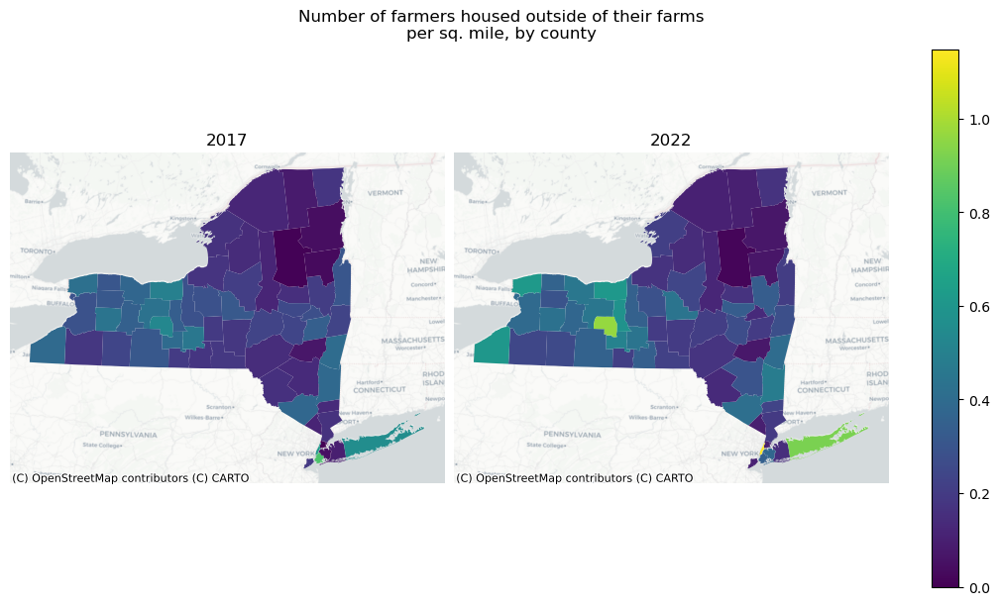

In [291]:
pair_map(gdf_ag_county_2017,gdf_ag_county_2022,'housed_off_farm_per_sqmi',proj_nys_east,"Number of farmers housed outside of their farms\nper sq. mile, by county")

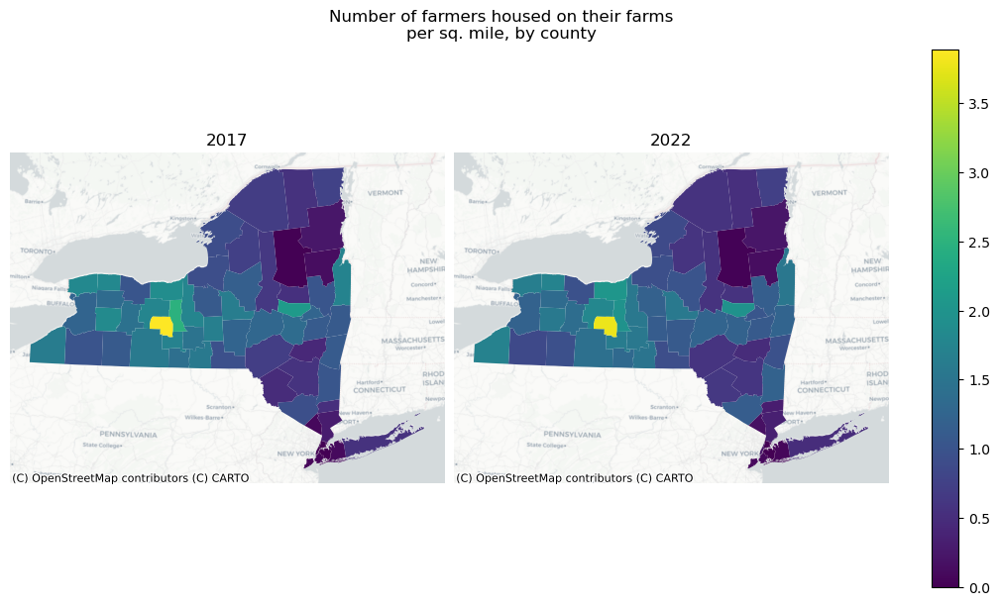

In [292]:
pair_map(gdf_ag_county_2017,gdf_ag_county_2022,'housed_on_farm_per_sqmi',proj_nys_east,"Number of farmers housed on their farms\nper sq. mile, by county")

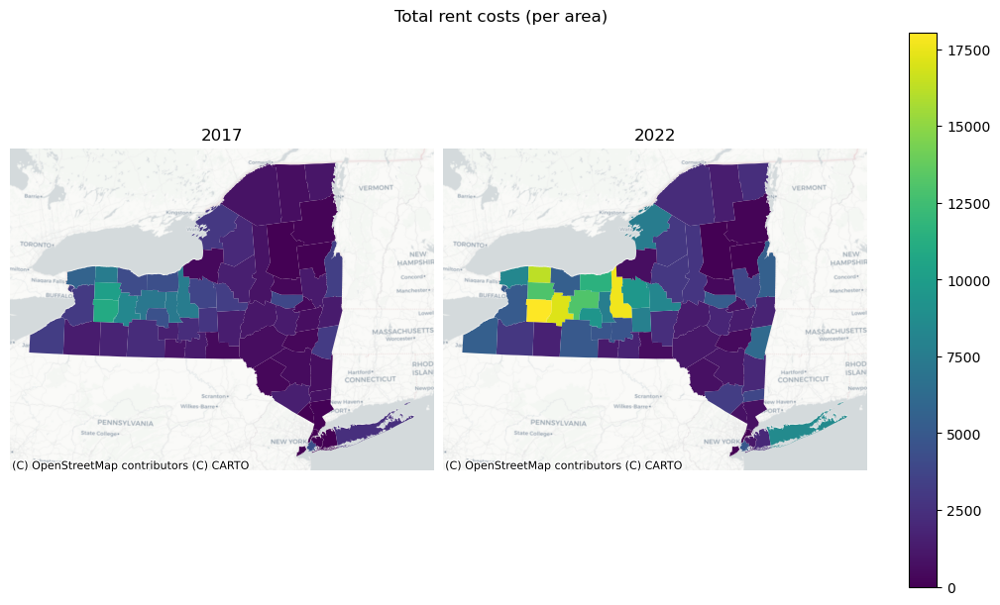

In [295]:
pair_map(gdf_ag_county_2017,gdf_ag_county_2022,'rent_costs_dollars_per_area',proj_nys_east,"Total rent costs (per area)")

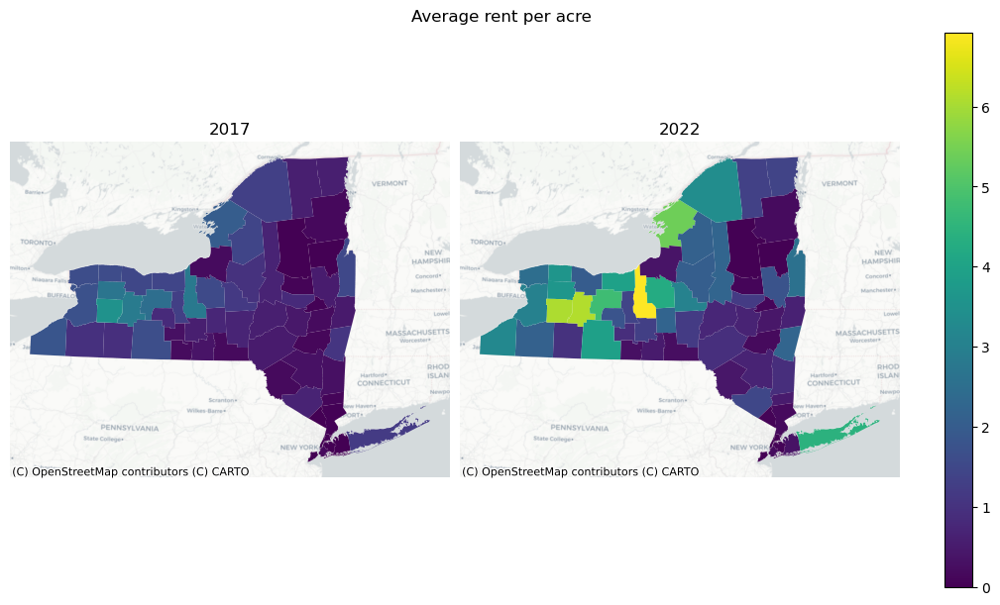

In [305]:
pair_map(gdf_ag_county_2017,gdf_ag_county_2022,'rent_per_rented_area',proj_nys_east,"Average rent per acre")

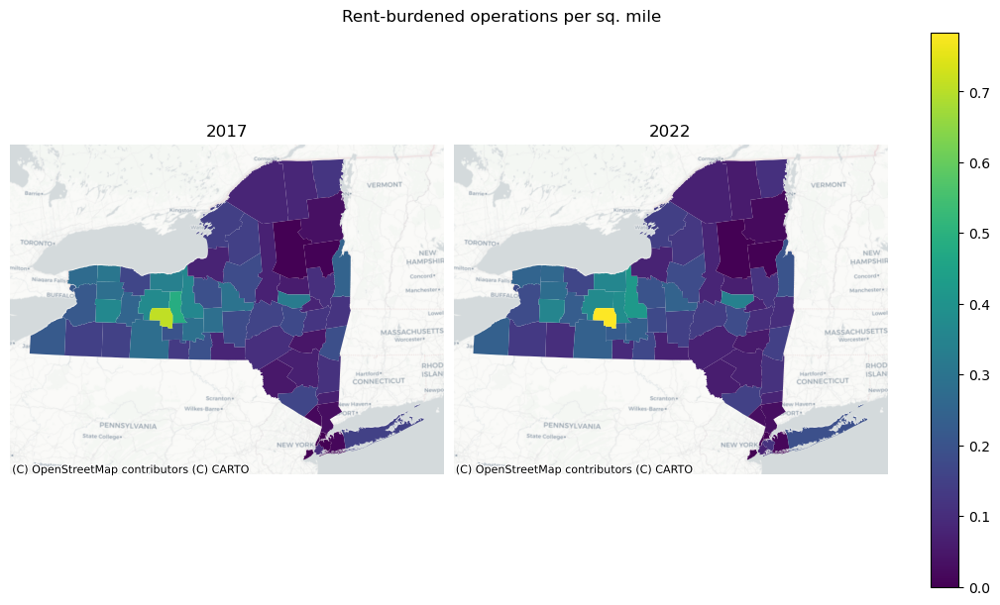

In [294]:
pair_map(gdf_ag_county_2017,gdf_ag_county_2022,'rent_burdened_operations_per_sqmi',proj_nys_east,"Rent-burdened operations per sq. mile")

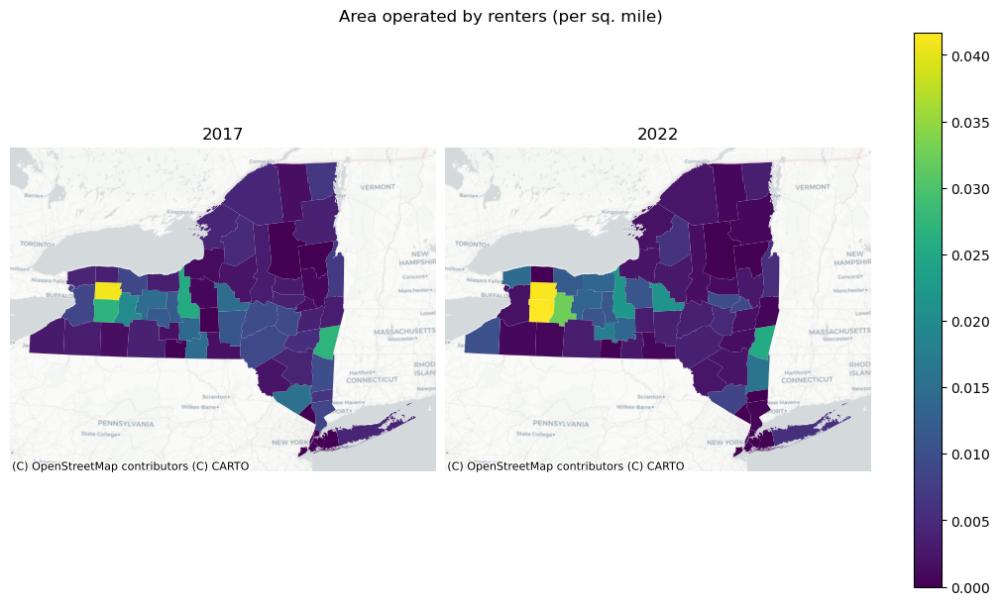

In [296]:
pair_map(gdf_ag_county_2017,gdf_ag_county_2022,'area_operated_tenants_per_sqmi',proj_nys_east,"Area operated by renters (per sq. mile)")

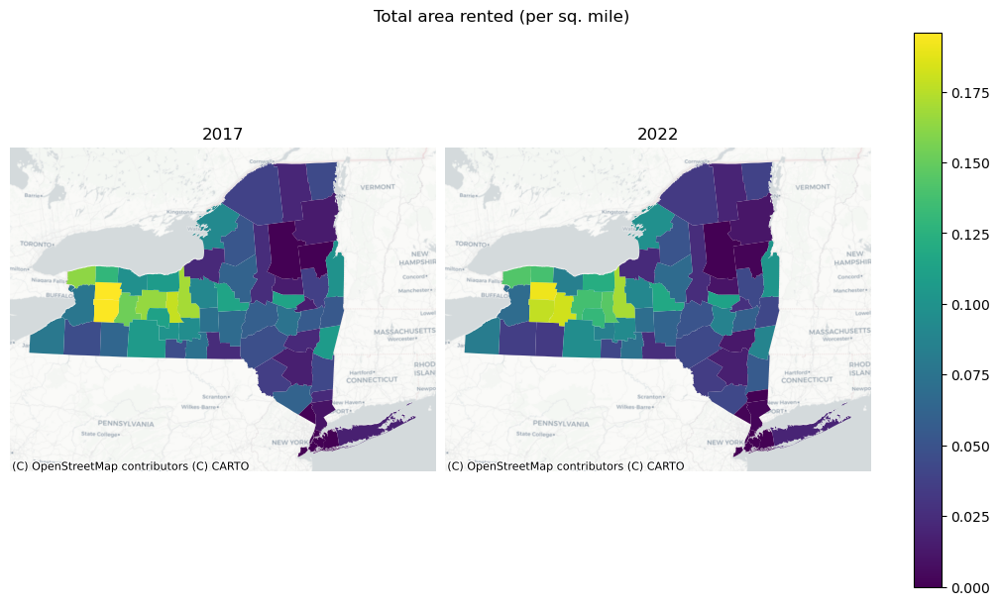

In [309]:
pair_map(gdf_ag_county_2017,gdf_ag_county_2022,'total_rented_area_per_sqmi',proj_nys_east,"Total area rented (per sq. mile)")

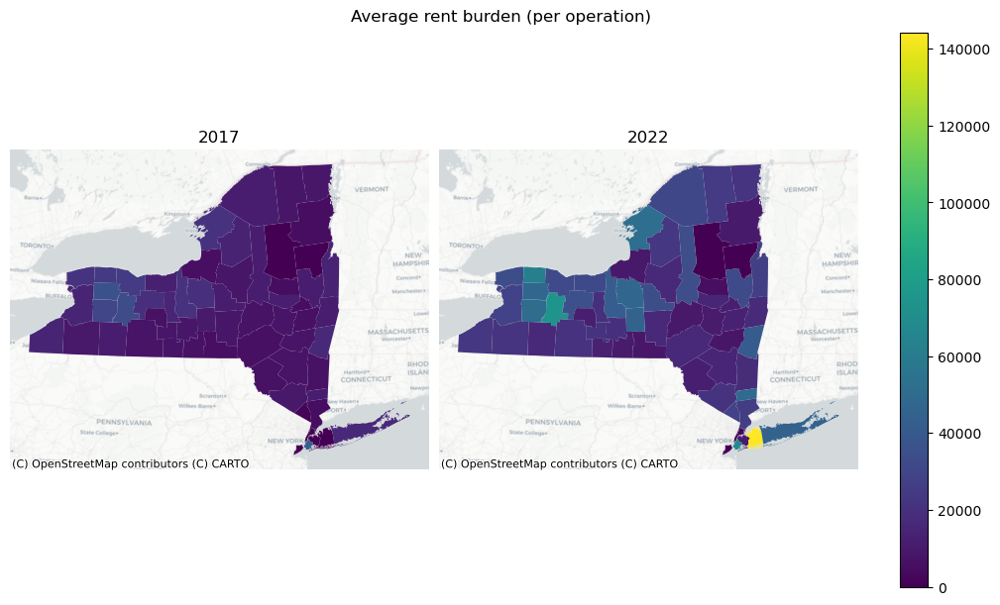

In [301]:
pair_map(gdf_ag_county_2017,gdf_ag_county_2022,'avg_rent_burden',proj_nys_east,"Average rent burden (per operation)")

## Areal Interpolation

In [228]:
ag_zipcode_2017_hex = area_interpolate(source_df=gdf_ag_zipcode_2017.to_crs(proj_ea), target_df=make_hex_grid(gdf_ag_zipcode_2017,resolution=8), intensive_variables=[col for col in gdf_ag_zipcode_2017.columns if (col.startswith("pct_") or "_per_" in col or col.endswith("_index"))])

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\pyproj\crs\crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


In [229]:
ag_zipcode_2022_hex = area_interpolate(source_df=gdf_ag_zipcode_2022.to_crs(proj_ea), target_df=make_hex_grid(gdf_ag_zipcode_2022,resolution=8), intensive_variables=[col for col in gdf_ag_zipcode_2022.columns if (col.startswith("pct_") or "_per_" in col or col.endswith("_index"))])

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\pyproj\crs\crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


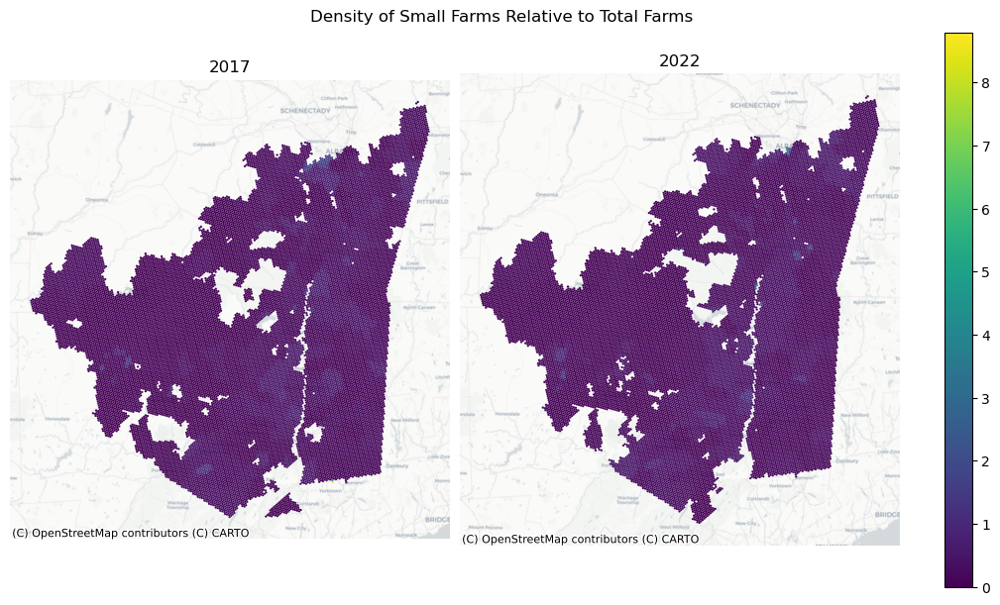

In [245]:
pair_map(ag_zipcode_2017_hex,ag_zipcode_2022_hex,"small_farm_index", crs=proj_hudson_ft, title="Density of Small Farms Relative to Total Farms")

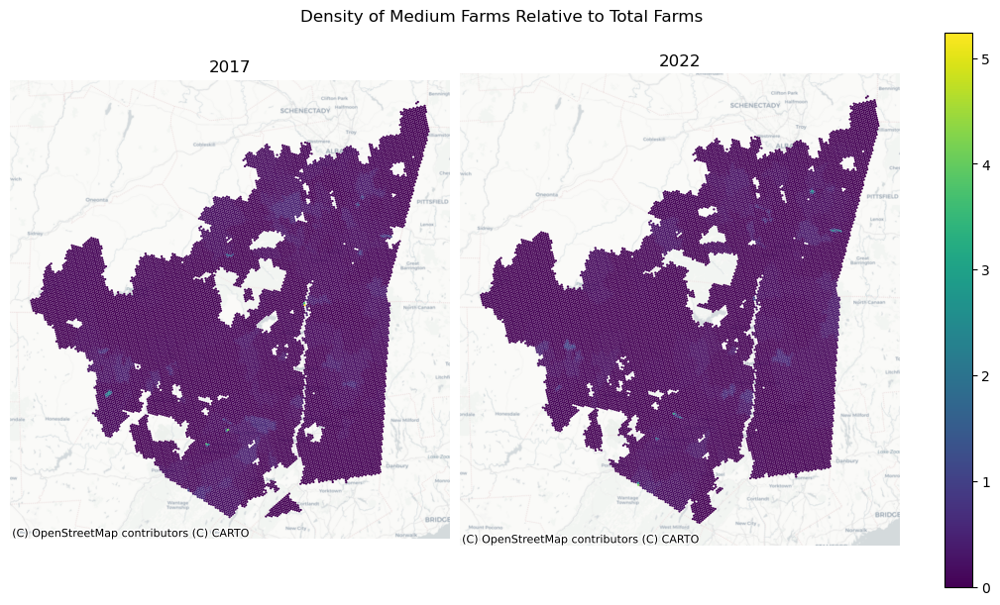

In [246]:
pair_map(ag_zipcode_2017_hex,ag_zipcode_2022_hex,"medium_farm_index", crs=proj_hudson_ft, title="Density of Medium Farms Relative to Total Farms")

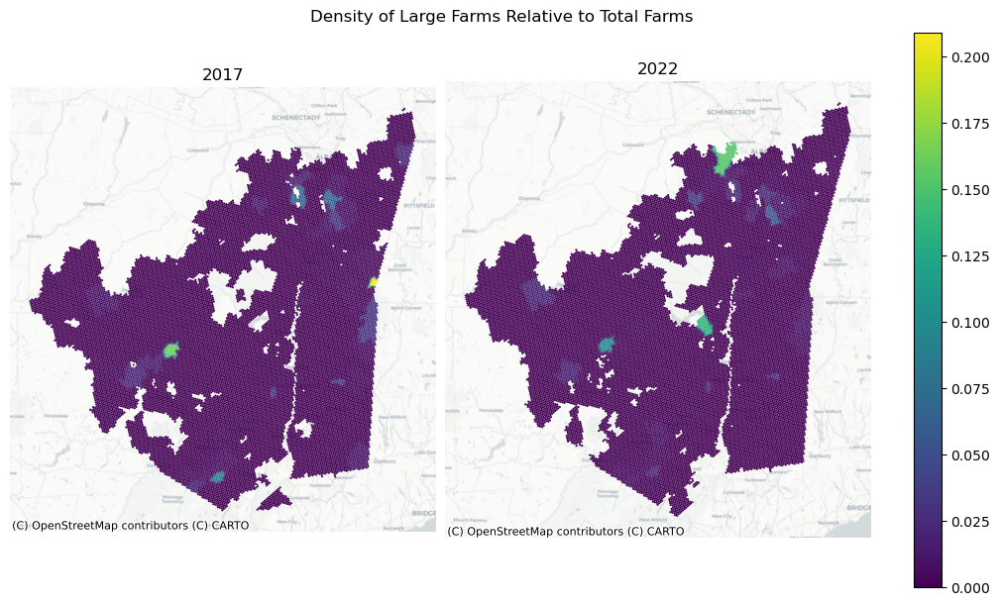

In [247]:
pair_map(ag_zipcode_2017_hex,ag_zipcode_2022_hex,"large_farm_index", crs=proj_hudson_ft, title="Density of Large Farms Relative to Total Farms")

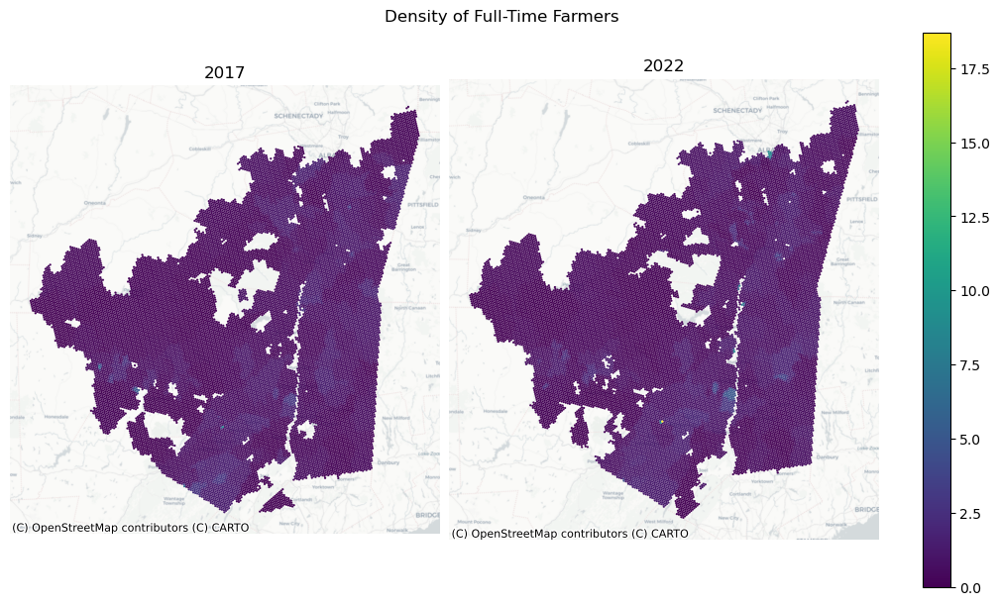

In [233]:
pair_map(ag_zipcode_2017_hex,ag_zipcode_2022_hex,"full_time_farmers_per_sqmi", crs=proj_hudson_ft, title="Density of Full-Time Farmers")

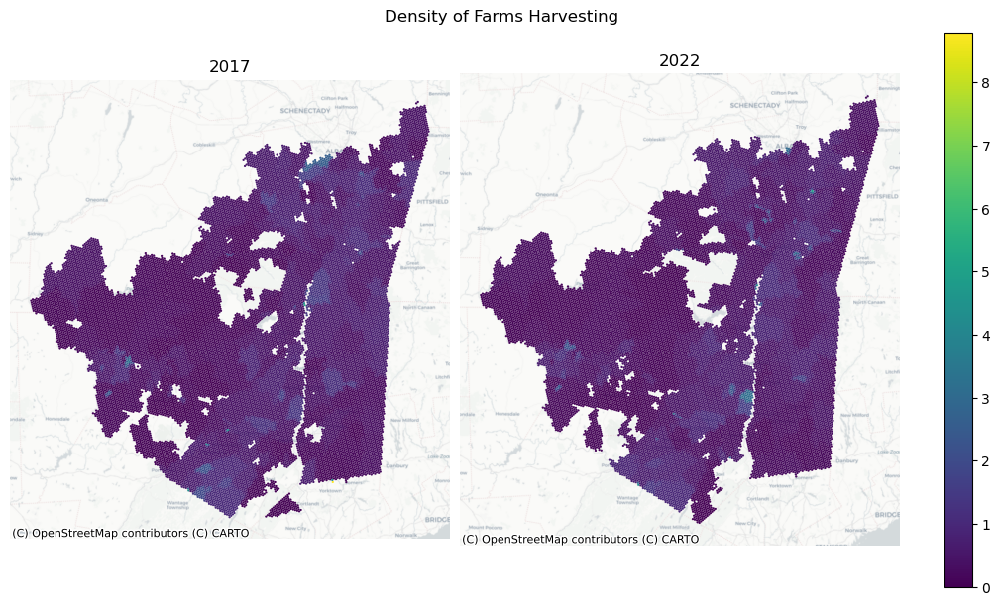

In [234]:
pair_map(ag_zipcode_2017_hex,ag_zipcode_2022_hex,"farms_harvesting_per_sqmi", crs=proj_hudson_ft, title="Density of Farms Harvesting")

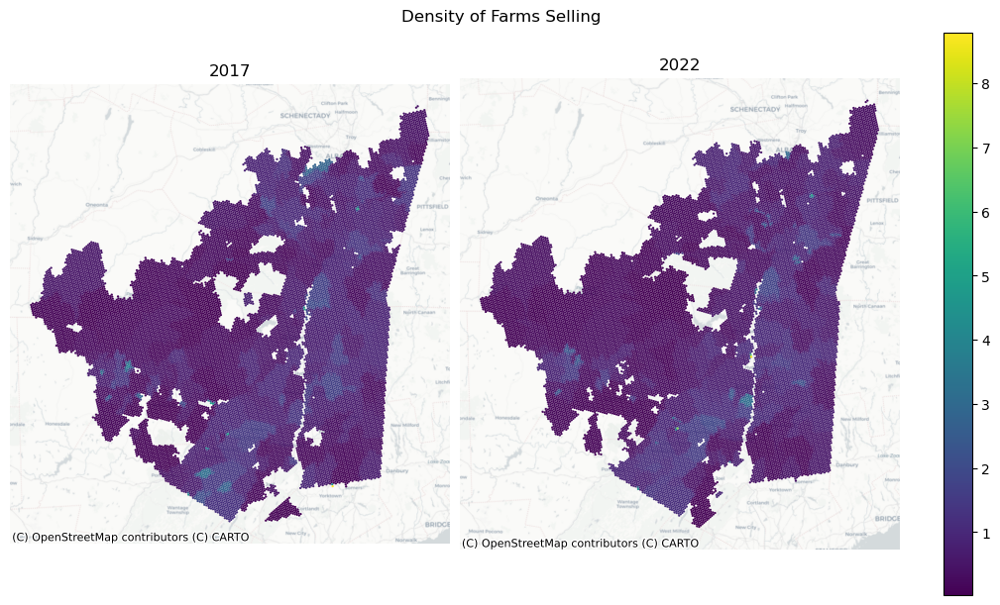

In [235]:
pair_map(ag_zipcode_2017_hex,ag_zipcode_2022_hex,"farms_selling_per_sqmi", crs=proj_hudson_ft, title="Density of Farms Selling")

In [371]:
gdf_acs_2017.columns

Index(['geometry', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE', 'GEOID_x',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT',
       'INTPTLON', 'STATE', 'COUNTY', 'TRACT', 'BLOCK_GROUP', 'NAME',
       'GEOID_y', 'GEOIDbg', 'total_pop', 'total_occupied',
       'total_occupied_renter', 'total_occupied_owner', 'total_vacant',
       'seasonal_vacancy', 'total_dwellings', 'income_median',
       'moveinyear_all_trimean', 'moveinyear_owner_trimean',
       'moveinyear_renter_trimean', 'moveinyear_pct_new_all',
       'moveinyear_pct_new_owner', 'moveinyear_pct_new_total_owner',
       'moveinyear_pct_new_renter', 'moveinyear_pct_new_total_renter',
       'rent_lower_quartile', 'rent_median', 'rent_upper_quartile',
       'rent_trimean', 'rentpctincome_median', 'seasonal_vacancy_pct',
       'pop_area'],
      dtype='object')

In [368]:
acs_intensive_vars = [col for col in gdf_acs_2017.columns if ('_pct' in col or col.endswith('_median') or col.endswith('_trimean') or col.endswith('_quartile') or col.endswith("_area"))]

In [434]:
acs_2017_hex = area_interpolate(source_df=gdf_acs_2017.to_crs(proj_ea), target_df=make_hex_grid(gdf_acs_2017,resolution=8), intensive_variables=acs_intensive_vars)

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\pyproj\crs\crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\tobler\util\util.py:60: UserWarning: nan values in variable: income_median, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\tobler\util\util.py:60: UserWarning: nan values in variable: moveinyear_all_trimean, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\tobler\util\util.py:60: UserWarning: nan values in variable: moveinyear_owner_trimean, replacing with 0
  warn(f"nan values in variable: {column}, repla

In [435]:
acs_2022_hex = area_interpolate(source_df=gdf_acs_2022.to_crs(proj_ea), target_df=make_hex_grid(gdf_acs_2022,resolution=8), intensive_variables=acs_intensive_vars)

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\pyproj\crs\crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\tobler\util\util.py:60: UserWarning: nan values in variable: income_median, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\tobler\util\util.py:60: UserWarning: nan values in variable: moveinyear_all_trimean, replacing with 0
  warn(f"nan values in variable: {column}, replacing with 0")
c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\tobler\util\util.py:60: UserWarning: nan values in variable: moveinyear_owner_trimean, replacing with 0
  warn(f"nan values in variable: {column}, repla

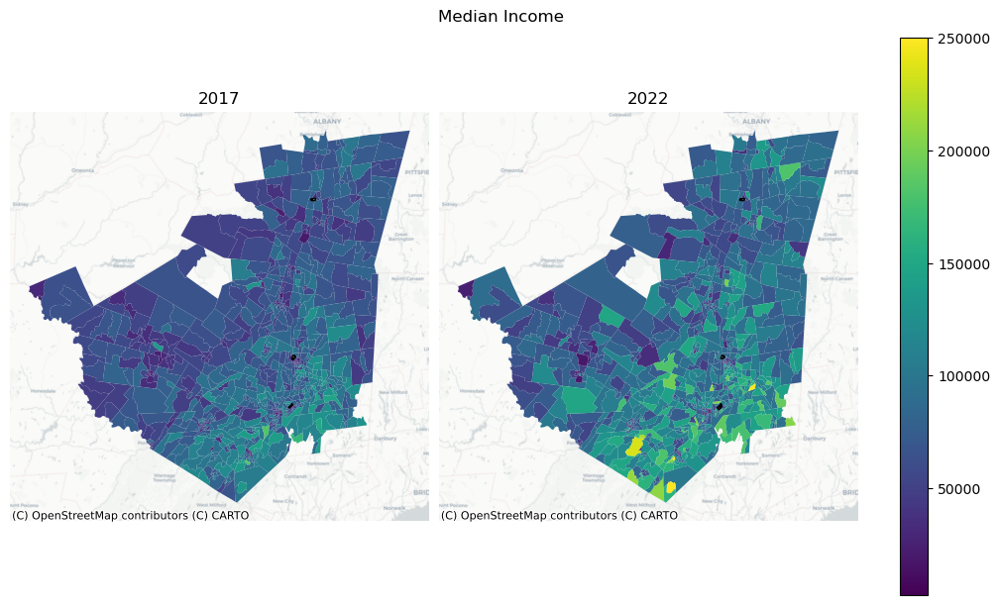

In [374]:
pair_map(gdf_acs_2017,gdf_acs_2022,"income_median",proj_hudson_ft,"Median Income")

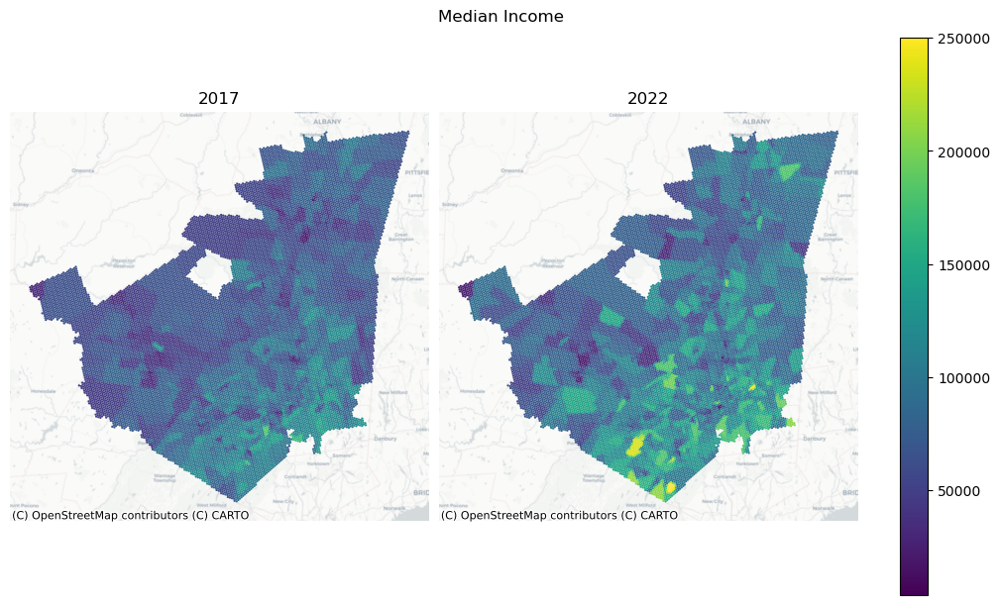

In [373]:
pair_map(acs_2017_hex,acs_2022_hex,"income_median",proj_hudson_ft,"Median Income")

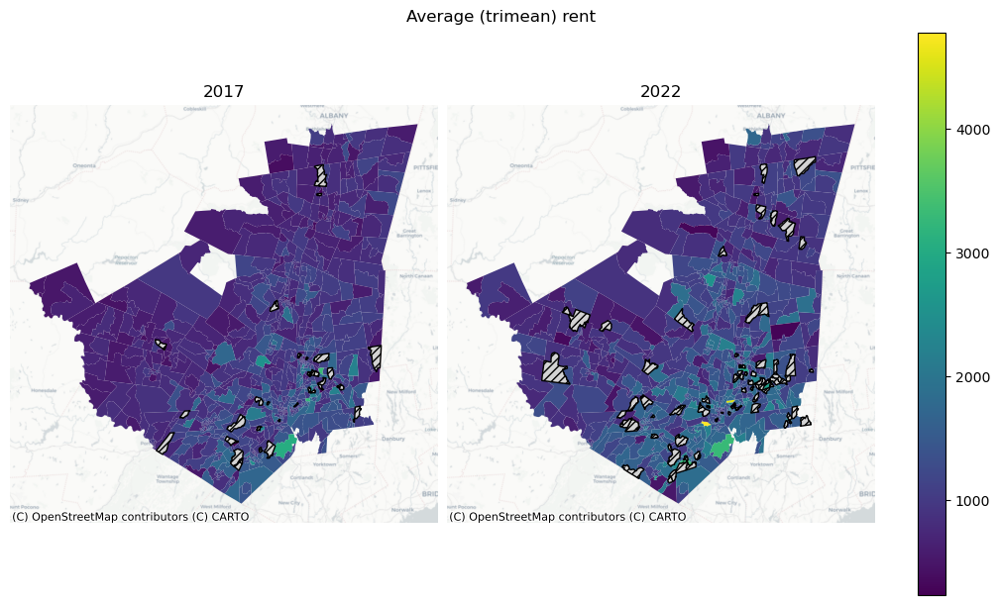

In [376]:
pair_map(gdf_acs_2017,gdf_acs_2022,"rent_trimean",proj_hudson_ft,"Average (trimean) rent")

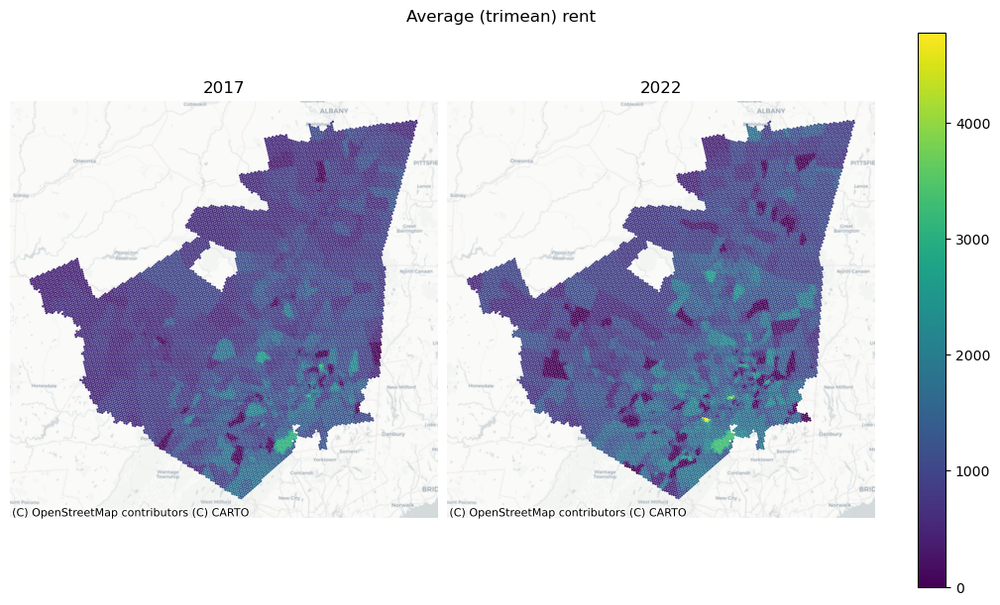

In [377]:
pair_map(acs_2017_hex,acs_2022_hex,"rent_trimean",proj_hudson_ft,"Average (trimean) rent")

### Drop zeroes for ACS hex cells that are actually NA

In [436]:
bgs_hex_sjoin_2017 = bgs_hex.to_crs(proj_ea).sjoin(gdf_acs_2017.to_crs(proj_ea),how="left",predicate="intersects")

In [437]:
bgs_hex_sjoin_2017.columns

Index(['geometry', 'index_right', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE',
       'GEOID_x', 'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER',
       'INTPTLAT', 'INTPTLON', 'STATE', 'COUNTY', 'TRACT', 'BLOCK_GROUP',
       'NAME', 'GEOID_y', 'GEOIDbg', 'total_pop', 'total_occupied',
       'total_occupied_renter', 'total_occupied_owner', 'total_vacant',
       'seasonal_vacancy', 'total_dwellings', 'income_median',
       'moveinyear_all_trimean', 'moveinyear_owner_trimean',
       'moveinyear_renter_trimean', 'moveinyear_pct_new_all',
       'moveinyear_pct_new_owner', 'moveinyear_pct_new_total_owner',
       'moveinyear_pct_new_renter', 'moveinyear_pct_new_total_renter',
       'rent_lower_quartile', 'rent_median', 'rent_upper_quartile',
       'rent_trimean', 'rentpctincome_median', 'seasonal_vacancy_pct',
       'pop_area'],
      dtype='object')

In [438]:
bgs_hex_sjoin_2017 = bgs_hex_sjoin_2017.groupby('hex_id')[bgs_hex_sjoin_2017.columns[21:]].mean()

In [439]:
i = 0
for idx, row in acs_2017_hex.iterrows():
    for key, val in row.items():
        if val == 0:
            if np.isnan(bgs_hex_sjoin_2017.loc[idx, key]):
                acs_2017_hex.at[idx, key] = np.nan
                i+=1
print(i)


1178


In [440]:
bgs_hex_sjoin_2022 = bgs_hex.to_crs(proj_ea).sjoin(gdf_acs_2022.to_crs(proj_ea),how="left",predicate="intersects")
bgs_hex_sjoin_2022 = bgs_hex_sjoin_2022.groupby('hex_id')[bgs_hex_sjoin_2022.columns[21:]].mean()

i = 0
for idx, row in acs_2022_hex.iterrows():
    for key, val in row.items():
        if val == 0:
            if np.isnan(bgs_hex_sjoin_2022.loc[idx, key]):
                acs_2022_hex.at[idx, key] = np.nan
                i+=1
print(i)


4169


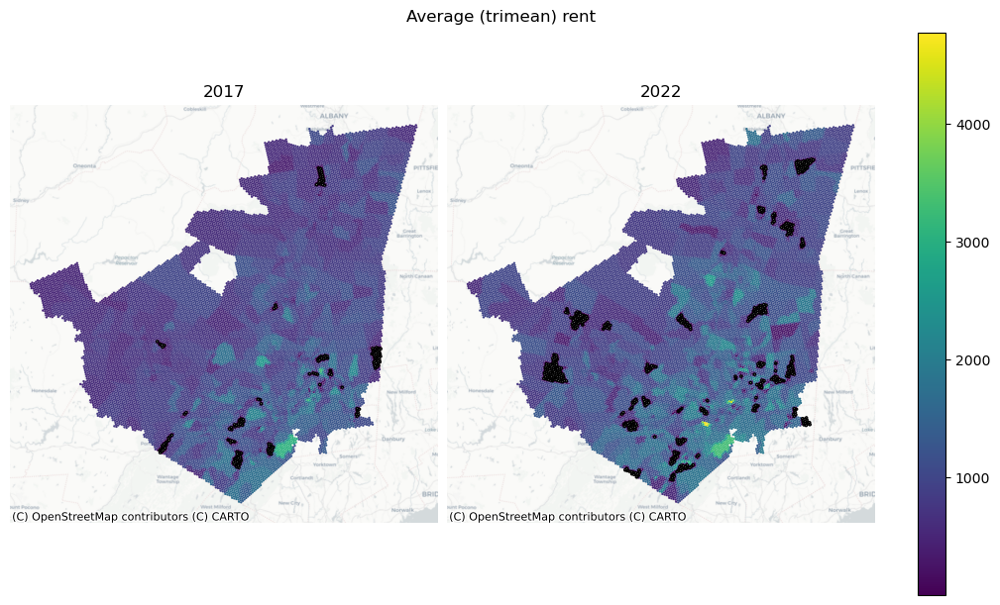

In [441]:
pair_map(acs_2017_hex,acs_2022_hex,"rent_trimean",proj_hudson_ft,"Average (trimean) rent")

## Combine ACS and Agriculture hex grids

In [ ]:
hudson_2017_hex = ag_zipcode_2017_hex.reset_index().sjoin(acs_2017_hex.reset_index(), how="right", predicate="intersects", on_attribute="hex_id")
hudson_2017_hex.drop("index_left", axis=1, inplace=True)

In [ ]:
hudson_2022_hex = ag_zipcode_2022_hex.reset_index().sjoin(acs_2022_hex.reset_index(), how="right", predicate="intersects", on_attribute="hex_id")
hudson_2022_hex.drop("index_left", axis=1, inplace=True)